# Generating Celeb Faces

In [2]:
!git clone https://github.com/AshishJangra27/Face-Generator-with-GAN

Cloning into 'Face-Generator-with-GAN'...
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 34 (delta 10), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (34/34), 160.27 MiB | 15.97 MiB/s, done.
Resolving deltas: 100% (10/10), done.


In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

generator = tf.keras.models.load_model('/content/Face-Generator-with-GAN/generator_700.h5', compile=False)

(np.float64(-0.5), np.float64(127.5), np.float64(127.5), np.float64(-0.5))

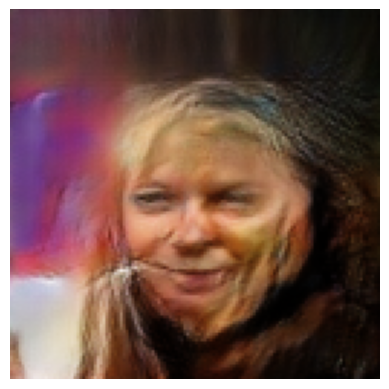

In [4]:
noise = tf.random.normal([1, 100])
# noise += .5

with tf.device('/CPU:0'):
    generated_images = generator(noise, training=False)

generated_images = (generated_images + 1) / 2.0

plt.imshow(generated_images[0])
plt.axis('off')

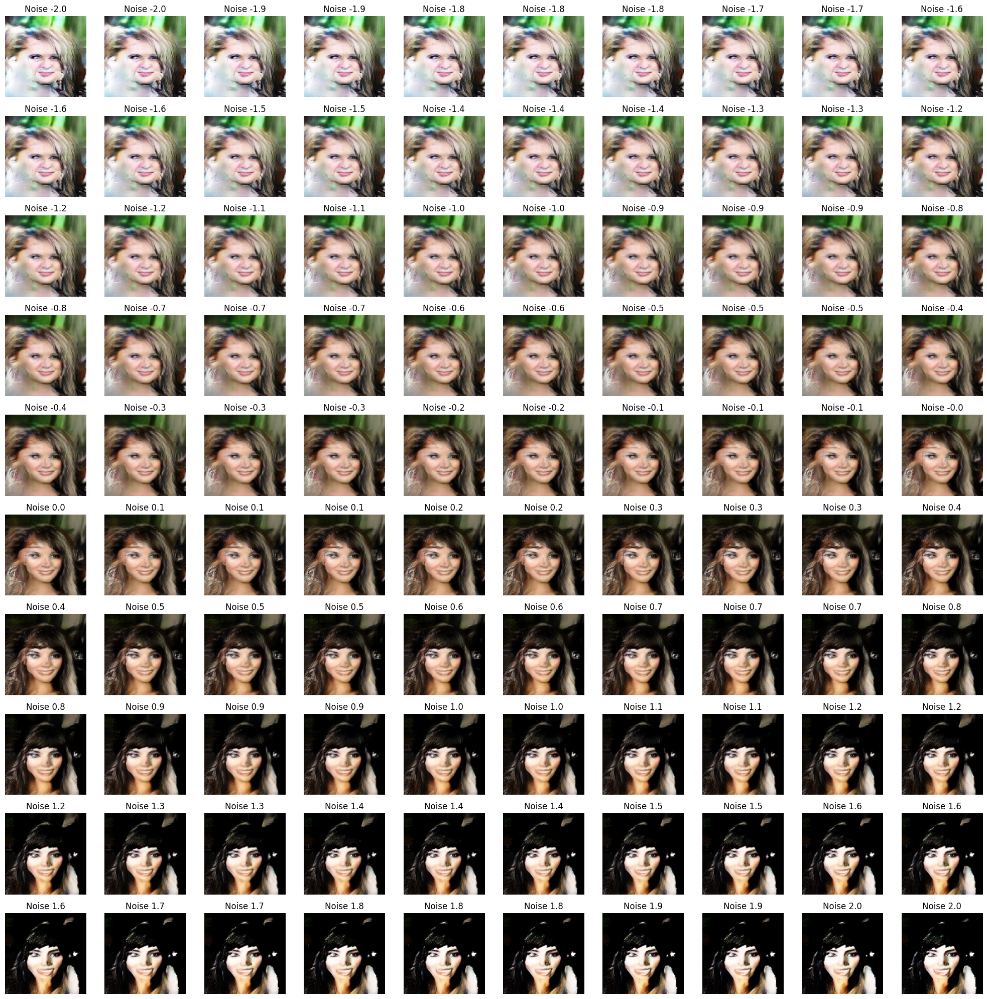

In [5]:
def generate_variations(model, noise_dim=100, num_variations=100):

    base_noise = tf.random.normal([1, noise_dim])

    noise_modifications = np.linspace(-2, 2, num_variations)

    fig, axes = plt.subplots(10, 10, figsize=(20, 20))  # 2 rows, 5 columns

    for i, noise_offset in enumerate(noise_modifications):
        variation_noise = base_noise + noise_offset

        with tf.device('/CPU:0'):
            generated_image = model(variation_noise, training=False)

        generated_image = (generated_image + 1) / 2.0

        ax = axes[i // 10, i % 10]
        ax.imshow(generated_image[0])
        ax.axis('off')
        ax.set_title(f"Noise {noise_offset:.1f}")

    plt.tight_layout()
    plt.show()

# Generate and display variations
generate_variations(generator)

In [6]:
import imageio

def generate_grid_progression_gifs(model, noise_dim=100, grid_size=10, steps_per_gif=20, output_dir="gifs"):
    os.makedirs(output_dir, exist_ok=True)

    num_variations = grid_size * grid_size
    base_noise = tf.random.normal([1, noise_dim])

    # Scalar offsets for each variation
    noise_offsets = np.linspace(-2, 2, num_variations)

    # Prepare a figure for the grid
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20))

    for idx, offset in enumerate(noise_offsets):
        images = []
        progression = np.linspace(0, offset, steps_per_gif)

        for step in progression:
            variation_noise = base_noise + step
            with tf.device('/CPU:0'):
                img = model(variation_noise, training=False)

            img = (img[0] + 1) / 2.0  # scale [-1,1] → [0,1]
            img_uint8 = (img.numpy() * 255).astype(np.uint8)
            images.append(img_uint8)

        # Save GIF for this variation
        gif_path = os.path.join(output_dir, f"variation_{idx}.gif")
        imageio.mimsave(gif_path, images, fps=10)

        # Also plot the final variation in the grid
        ax = axes[idx // grid_size, idx % grid_size]
        ax.imshow(images[-1])
        ax.axis('off')
        ax.set_title(f"Var {idx}", fontsize=6)

        print(f"Saved GIF: {gif_path}")

    plt.tight_layout()
    plt.show()


Saved GIF: gifs/variation_0.gif
Saved GIF: gifs/variation_1.gif
Saved GIF: gifs/variation_2.gif
Saved GIF: gifs/variation_3.gif
Saved GIF: gifs/variation_4.gif
Saved GIF: gifs/variation_5.gif
Saved GIF: gifs/variation_6.gif
Saved GIF: gifs/variation_7.gif
Saved GIF: gifs/variation_8.gif
Saved GIF: gifs/variation_9.gif
Saved GIF: gifs/variation_10.gif
Saved GIF: gifs/variation_11.gif
Saved GIF: gifs/variation_12.gif
Saved GIF: gifs/variation_13.gif
Saved GIF: gifs/variation_14.gif
Saved GIF: gifs/variation_15.gif
Saved GIF: gifs/variation_16.gif
Saved GIF: gifs/variation_17.gif
Saved GIF: gifs/variation_18.gif
Saved GIF: gifs/variation_19.gif
Saved GIF: gifs/variation_20.gif
Saved GIF: gifs/variation_21.gif
Saved GIF: gifs/variation_22.gif
Saved GIF: gifs/variation_23.gif
Saved GIF: gifs/variation_24.gif
Saved GIF: gifs/variation_25.gif
Saved GIF: gifs/variation_26.gif
Saved GIF: gifs/variation_27.gif
Saved GIF: gifs/variation_28.gif
Saved GIF: gifs/variation_29.gif
Saved GIF: gifs/vari

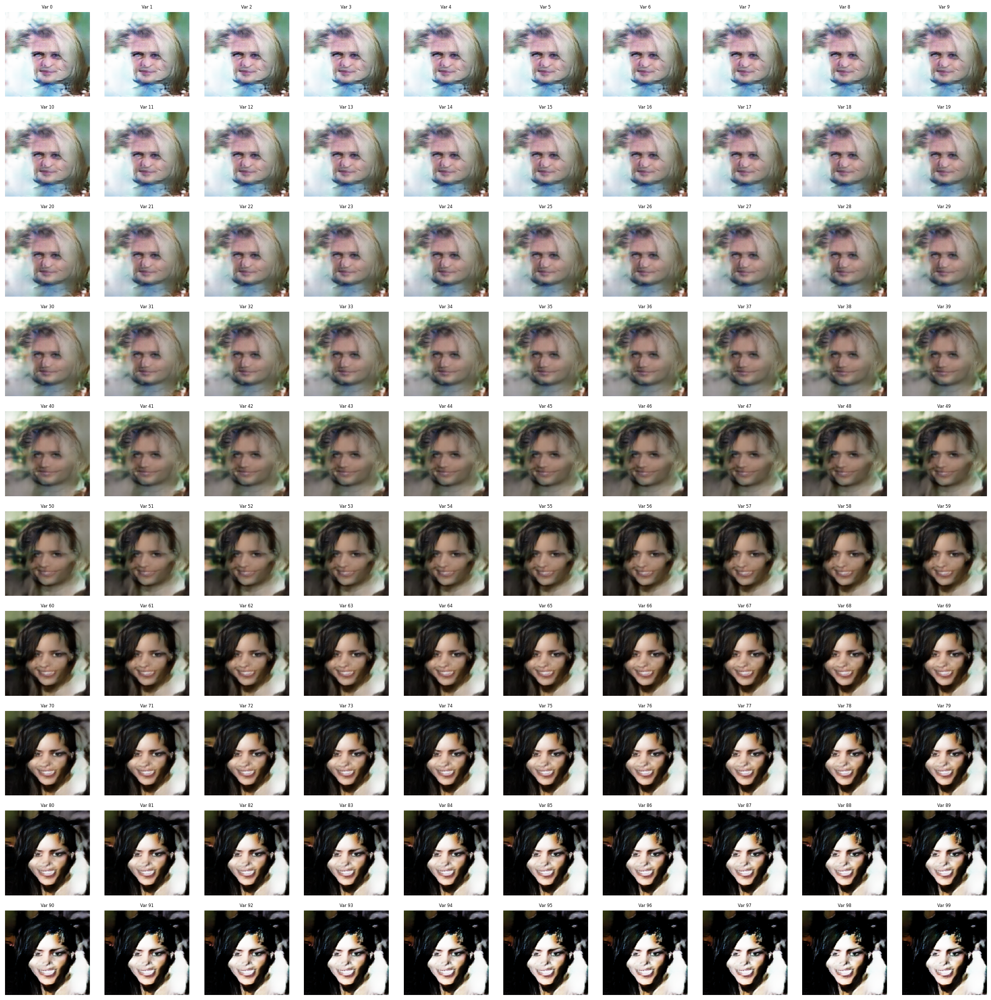

In [7]:
generate_grid_progression_gifs(generator, noise_dim=100, grid_size=10, steps_per_gif=25)


In [8]:
import zipfile
import os
from google.colab import files

# Define the directory to be zipped and the name of the output zip file
gifs_directory = 'gifs'
zip_file_name = 'generated_gifs.zip'

# Create a ZipFile object in write mode
with zipfile.ZipFile(zip_file_name, 'w') as zipf:
    # Iterate over all files in the directory
    for root, dirs, files_in_dir in os.walk(gifs_directory):
        for file in files_in_dir:
            # Create an absolute path for the file
            file_path = os.path.join(root, file)
            # Add file to zip (arcname is the path inside the zip file)
            zipf.write(file_path, os.path.relpath(file_path, gifs_directory))

print(f"'{gifs_directory}' folder successfully zipped into '{zip_file_name}'.")

# Download the zip file
files.download(zip_file_name)

'gifs' folder successfully zipped into 'generated_gifs.zip'.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>